In [359]:
# Installs

In [360]:
# Imports

import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np
from scipy.io import wavfile
import librosa
import random
import pyaudio
import time

# Question 1

The sound produced by individual bubble is mainly due to the frequency and dampening of a bubble described by the equations in the paper as well as the rising pitch of a bubble created close to the surface. Furthmore a small bubble mainly sounds like an impulse whereas a large bubble is found to be unnatural sounding on its own. However, they discussed in the paper that is most likely due to large bubbles not occuring in isolation, a large bubble itself creates many smaller bubbles too.

# Question 2

To create complex sounds statistically you are basically merging many individual bubble sounds together. A large population of bubbkles is created with the Minneart model and excited according to stochastic processes. The creation of these bubbles have varying radii to produce a complex sound and each of these bubbles with different properties were created based on a Poisson distribution. The bubbles also have a gain and depth factors, with more depth meaning greater attenuation.

# Question 3

Got water plop sound from youtube since I couldn't record one well with my janky phone. Plotted the time-domain of the droplet below.

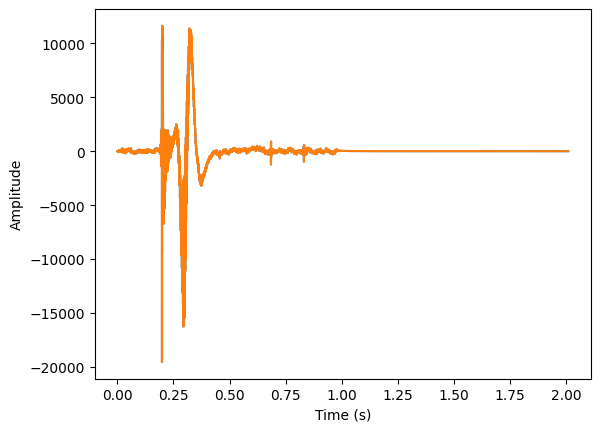

In [361]:
# Question 3
srate, data = wavfile.read('water_plop.wav')
duration = len(data) / srate
times = np.linspace(0, duration, len(data))

plt.plot(times, data)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Question 4

Plotted the linear and dB magnitude spectrums and melspectrograms for the water plop. The spectrogram works way better with the logarithmic cB measurements than the linear scaling, but the mag spec seems clearer using a linear scale.

/var/folders/b6/b336n4sx33x293__9dd89bxw0000gp/T/ipykernel_52944/2297885120.py:16: RuntimeWarning: divide by zero encountered in log10
  dBXmag = 20 * np.log10(Xmag)


[Text(0.5, 1.0, 'dB Mel-frequency spectrogram')]

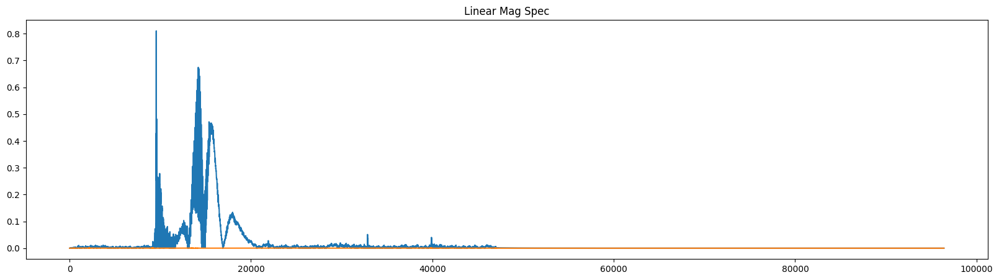

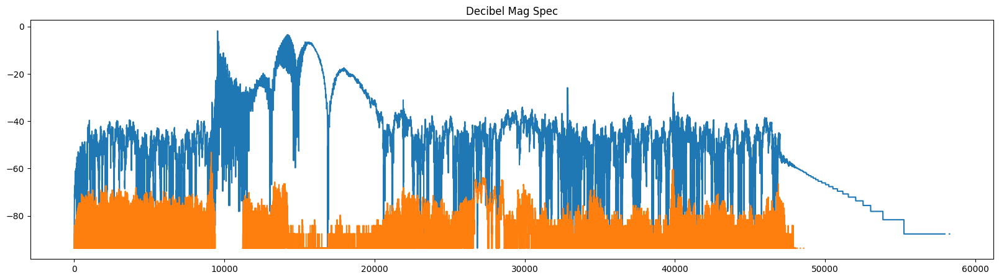

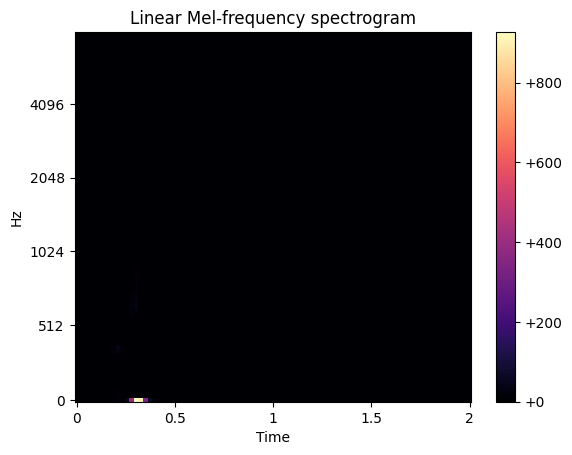

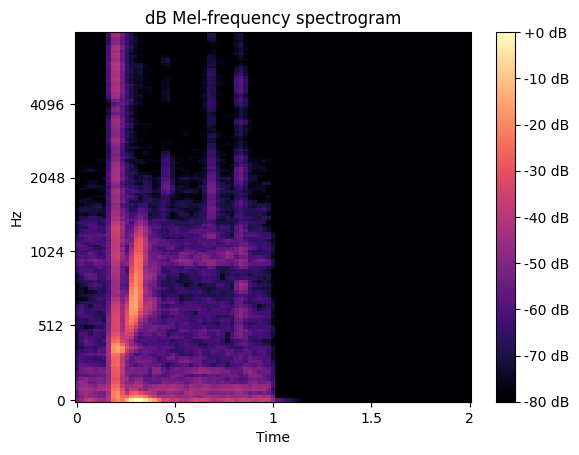

In [362]:
# Question 4
# Resource: https://github.com/gtzan/mir_program_kadenze/blob/master/course1/session2/kadenze_mir_c1_s2_6_mag_spectra.ipynb
# and https://librosa.org/doc/main/generated/librosa.feature.melspectrogram.html

def plot_mag_spectrum(Xmag, title): 
    plt.figure(figsize=(20,5))
    n = np.arange(0,len(Xmag))
    plt.plot(n,Xmag)
    plt.title(title)

N = len(data)
X = np.fft.fft(data)
Xmag = 2 * np.abs(X) / N 
plot_mag_spectrum(Xmag, 'Linear Mag Spec')

dBXmag = 20 * np.log10(Xmag)
plot_mag_spectrum(dBXmag, 'Decibel Mag Spec')

y,sr = librosa.load("water_plop.wav")
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
fig, ax = plt.subplots()
img = librosa.display.specshow(S, x_axis='time', y_axis='mel', sr=sr, fmax=8000, ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f')
ax.set(title='Linear Mel-frequency spectrogram')

fig, ax = plt.subplots()
S_dB = librosa.power_to_db(S, ref=np.max)
img = librosa.display.specshow(S_dB, x_axis='time', y_axis='mel', sr=sr, fmax=8000, ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='dB Mel-frequency spectrogram')


# Question 5

Using the calculations from the paper created a decaying sinusoid, with the basic radius and frequency from the paper too. Currently sounds a lot like a string being plucked.

In [363]:
# Question 5
# impulse = a*sin(2πf t)*e^(−dt)
# a = amplitude, f = frequency, t = time, r = radius (in meters), d = 0.13/r + 0.0072r^(−3/2)

def decaying_impulse(freq, amp, t, r):
    d = 0.13/r + 0.0072*r**(-3/2)
    impulse = amp * np.sin(2*np.pi*freq*t) * np.exp(-d*t)
    return impulse

radius = 0.015
freq = 3/radius
data5 = decaying_impulse(freq, 1, times, radius)
ipd.Audio(data5, rate=srate)


# Question 6

Re-created the user study with a range of radii and xi values. The xi values created the sweeping sound of a bubble rising to the surface and definitely added to the realism. Listening to all of the generated "bubbles" I would agree with the findings of the user study that the most realistic sounding "bubble" was the one with a radius of 0.004 meters and a xi value of 0.1.

In [364]:
# Question 6
# f(t) = f0(1 + σt)
# σ = xi*d

def bubble_impulse(amp, t, r, xi):
    freq = 3/r
    d =  0.043*freq + 0.0014*freq**(3/2)
    impulse = amp * np.sin(2*np.pi*freq*t*(1+xi*d*t)) * np.exp(-d*t)
    return impulse
    


radii = [0.010, 0.007, 0.004, 0.002, 0.001, 0.0005, 0.0003]
xis = [0, 0.05, 0.1]
data6 = []

for xi in xis:
    for r in radii:
        data6 = np.hstack([data6,bubble_impulse(1, times, r, xi)])

ipd.Audio(data6, rate=srate)


# Question 7

The article below was very helpful in understanding how the poisson distribution works. I works exponetially, that as more time passes the probability of a random event also increases. Therefore with a bubble_rate of 1000 bubbles/sec it makes sense that the average amount of time until the next bubble is created would be around 0.0010 second, which is roughly what we see in the plot below!

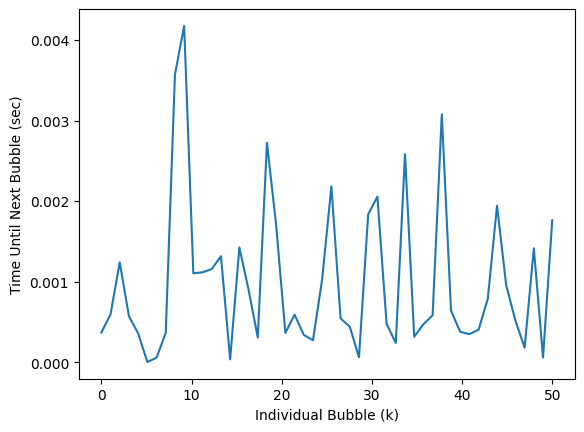

In [365]:
# Question 7
# Resource: https://preshing.com/20111007/how-to-generate-random-timings-for-a-poisson-process/

def plot_poisson(bubble_rate, N, srate):
    p_times = []
    for i in range(N):
        p_times.append(random.expovariate(bubble_rate))
    t = np.linspace(0,N,len(p_times))
    plt.plot(t, p_times)
    plt.xlabel('Individual Bubble (k)')
    plt.ylabel('Time Until Next Bubble (sec)')
    plt.show()

plot_poisson(1000, 50, srate)

# Question 8

Using what I learned about the poisson distribution in the last question, I converted "time until the next bubble" in seconds to "samples until the next bubble" by multiplying by the sample rate. Then the bubble synth takes in the radius and xi values (I added in a +- 10% variability to the radius for each bubble for more variety in the sounds produced), as well as the bubble rate and total duration, and generates a sound scape of bubbles.

In [366]:
# Question 8

def next_bubble(bubble_rate, srate):
    return int(random.expovariate(bubble_rate)*srate)

def play_bubble(amp, t, r=0.004, xi=0.1):
    freq = 3/r
    d =  0.043*freq + 0.0014*freq**(3/2)
    impulse = amp * np.sin(2*np.pi*freq*t*(1+xi*d*t)) * np.exp(-d*t)
    return impulse

def bubble_synth(durat, amp, radius, xi, bubble_rate, srate):
    samples = int(srate*durat)
    curr = 0
    bubble_time = np.linspace(0,1,srate)
    data = np.zeros(samples)
    if (samples<=len(bubble_time)):
        bubble_time =  np.linspace(0,0.1,int(srate/10))
    while (curr+len(bubble_time)<samples):
        r = random.uniform(radius*1.1, radius*0.9)
        data[curr:curr+len(bubble_time)] += play_bubble(amp,bubble_time, r, xi)
        curr += next_bubble(bubble_rate, srate)
    return data

data8 = bubble_synth(5, 1, 0.004, 0.1, 10, srate)
ipd.Audio(data8, rate=srate)

# Question 9

Firstly I made a range of bubble sizes and bubble rates to observe the different sounds the synth could make. From here I found that a good light rain preset could be a smaller rate with smaller bubbles, a heavy rain preset could be a large rate with small bubbles, and an ocean or waterfall soundscape could have a large rate with large bubbles. I chose not to have a preset for the small bubble rate with large bubbles, since I agreed with the paper that it doesn't sound very realistic (as discrete large bubbles don't really occur in nature and are always accompanied by smaller bubbles too).

In [367]:
# Question 9

def test_presets(srate):
    xi = 0.1
    radii_presets = [0.004, 0.04]
    bubble_rates = [10, 1000]
    durat = 5
    amp = 0.5
    data = []
    for rps in radii_presets:
        for brs in bubble_rates:
            data = np.hstack([data, bubble_synth(durat, amp, rps, xi, brs, srate)])
    return data

data9 = test_presets(srate)
ipd.Audio(data9, rate=srate)

In [368]:
# light rain preset
data9_1 = bubble_synth(5, 1, 0.004, 0.05, 25, srate)
print("light rain")
ipd.Audio(data9_1, rate=srate)

light rain


In [369]:
# heavy rain preset
data9_2 = bubble_synth(5, 1, 0.004, 0.1, 1000, srate)
print("heavy rain")
ipd.Audio(data9_2, rate=srate)

heavy rain


In [370]:
# ocean/waterfall preset
data9_3 = bubble_synth(5, 1, 0.04, 0.1, 1000, srate)
print("ocean or large waterfall")
ipd.Audio(data9_3, rate=srate)

ocean or large waterfall


# Question 10

For the realtime synth ideally I would have sliding scales like what they made for the paper so I could change radii and bubble rates on the fly, but here I just made a pyaudio stream like from the class notebook. I think another thing I would want to add is maybe an envelope so that the bubbles come in slowly at first, happen a lot in the middle, and slow down near the end (maybe an amplitude envelope as well)!

In [371]:
# Question 10
# Resource: https://github.com/gtzan/synthesizers_cs_perspective/blob/main/src/notebooks/buffers_envelopes_synthcsp.ipynb

CHUNK = 1024
SRATE = 48000

data = np.zeros(CHUNK)
data_ = bubble_synth(1, 1, 0.004, 0.05, 25, SRATE)

def callback(in_data, frame_count, time_info, status): 
    global data_
    data = data_[:frame_count]
    data_ = np.roll(data_, -frame_count)
    return (data.astype(np.float32), pyaudio.paContinue)

 # Instantiate PyAudio and initialize PortAudio system resources (2)
p = pyaudio.PyAudio()
stream = p.open(format=pyaudio.paFloat32,
                channels=1,
                rate=48000,
                output=True,
                frames_per_buffer=1024,
                stream_callback=callback)

t_end = time.time() + 5
# run the loop for 5 seconds 
while time.time() < t_end:
    if time.time() > t_end: 
        break
    time.sleep(0.01)
    
print('Playback done')
stream.close()
p.terminate()

Playback done
